# EDA

In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns
import os
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import missingno as msno
import ipywidgets as widgets

In [2]:
df = pd.read_csv("../data/matches_sq.csv")
df

/tmp/ipykernel_125459/1497358989.py:1: DtypeWarning: Columns (0: Referee, 1: Time, 2: B365CH) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../data/matches_sq.csv")


,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AwayTeam_sq_def_mean,AwayTeam_sq_def_top_mean,AwayTeam_sq_def_top3_mean,AwayTeam_sq_mid_mean,AwayTeam_sq_mid_top_mean,AwayTeam_sq_mid_top3_mean,AwayTeam_sq_att_mean,AwayTeam_sq_att_top_mean,AwayTeam_sq_att_top3_mean,AwayTeam_sq_mapped
0,E0,13/08/16,Burnley,Swansea,0,1,A,0.0,0.0,D,...,71.300000,79.0,77.000000,70.538462,82.0,79.666667,68.833333,80.0,78.000000,1
1,E0,13/08/16,Crystal Palace,West Brom,0,1,A,0.0,0.0,D,...,68.600000,79.0,77.666667,70.583333,80.0,78.000000,73.500000,80.0,76.666667,1
2,E0,13/08/16,Everton,Tottenham,1,1,D,1.0,0.0,H,...,72.545455,85.0,83.000000,73.133333,84.0,82.333333,74.000000,84.0,74.000000,1
3,E0,13/08/16,Hull,Leicester,2,1,H,1.0,0.0,H,...,71.272727,80.0,79.000000,71.363636,85.0,81.000000,72.428571,83.0,81.000000,1
4,E0,13/08/16,Man City,Sunderland,2,1,H,1.0,0.0,H,...,70.600000,78.0,77.000000,72.285714,79.0,78.000000,67.400000,80.0,72.333333,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30177,B1,23/05/2026,Oud-Heverlee Leuven,Genk,0,2,A,0.0,2.0,A,...,67.666667,76.0,75.333333,71.363636,78.0,77.000000,67.400000,72.0,70.333333,1
30178,B1,23/05/2026,Standard,Charleroi,0,2,A,0.0,0.0,D,...,66.857143,71.0,69.666667,67.888889,73.0,71.666667,61.600000,68.0,65.333333,1
30179,B1,24/05/2026,Club Brugge,Gent,5,0,H,3.0,0.0,H,...,66.888889,73.0,71.333333,68.000000,73.0,72.000000,67.500000,72.0,69.333333,1
30180,B1,24/05/2026,St Truiden,Mechelen,3,0,H,2.0,0.0,H,...,63.750000,68.0,67.000000,65.454545,74.0,71.666667,66.250000,73.0,69.000000,1


In [3]:
pd.set_option('display.max_info_columns', 300)
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 30182 entries, 0 to 30181
Data columns (total 222 columns):
 #    Column                     Non-Null Count  Dtype  
---   ------                     --------------  -----  
 0    Div                        30182 non-null  str    
 1    Date                       30182 non-null  str    
 2    HomeTeam                   30182 non-null  str    
 3    AwayTeam                   30182 non-null  str    
 4    FTHG                       30182 non-null  int64  
 5    FTAG                       30182 non-null  int64  
 6    FTR                        30182 non-null  str    
 7    HTHG                       30143 non-null  float64
 8    HTAG                       30143 non-null  float64
 9    HTR                        30143 non-null  str    
 10   Referee                    3800 non-null   str    
 11   HS                         28985 non-null  float64
 12   AS                         28985 non-null  float64
 13   HST                        28985 non-nul

In [4]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
FTHG,30182.0,1.56,1.31,0.00,1.00,1.0,2.00,10.00
FTAG,30182.0,1.25,1.18,0.00,0.00,1.0,2.00,13.00
HTHG,30143.0,0.69,0.84,0.00,0.00,0.0,1.00,6.00
HTAG,30143.0,0.55,0.76,0.00,0.00,0.0,1.00,7.00
HS,28985.0,13.52,5.37,0.00,10.00,13.0,17.00,46.00
...,...,...,...,...,...,...,...,...
AwayTeam_sq_mid_top3_mean,29308.0,75.92,4.88,61.00,72.33,76.0,79.00,90.00
AwayTeam_sq_att_mean,29290.0,70.91,4.63,58.20,67.60,70.6,74.00,86.00
AwayTeam_sq_att_top_mean,29290.0,76.60,5.76,60.00,73.00,76.0,80.00,94.00
AwayTeam_sq_att_top3_mean,29290.0,74.10,5.43,59.33,70.00,74.0,77.67,91.67


In [5]:
df.describe(include="object")

/tmp/ipykernel_125459/702825166.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  df.describe(include="object")


,Div,Date,HomeTeam,AwayTeam,FTR,HTR,Referee,Time,B365CH
count,30182,30182,30182,30182,30182,30143,3800,21230,21200.00
unique,9,2152,280,280,3,3,50,47,258.00
top,E0,22/12/2018,Crystal Palace,Tottenham,H,D,A Taylor,20:00,2.05
freq,3800,53,190,190,13371,12140,295,2033,418.00


Como se observa en información del dataframe, vemos que existen atributos con los nombres `Unnamed: 105`, `Unnamed: 119`, `Unnamed: 120` en los cuales sus respectivas columnas estan vacias, por lo cual vamos a eliminarlas.

In [6]:
df_clean = df.copy()
df_clean = df_clean.drop(columns=["Unnamed: 105", "Unnamed: 119", "Unnamed: 120"])
df_clean.info()

<class 'pandas.DataFrame'>
RangeIndex: 30182 entries, 0 to 30181
Data columns (total 219 columns):
 #    Column                     Non-Null Count  Dtype  
---   ------                     --------------  -----  
 0    Div                        30182 non-null  str    
 1    Date                       30182 non-null  str    
 2    HomeTeam                   30182 non-null  str    
 3    AwayTeam                   30182 non-null  str    
 4    FTHG                       30182 non-null  int64  
 5    FTAG                       30182 non-null  int64  
 6    FTR                        30182 non-null  str    
 7    HTHG                       30143 non-null  float64
 8    HTAG                       30143 non-null  float64
 9    HTR                        30143 non-null  str    
 10   Referee                    3800 non-null   str    
 11   HS                         28985 non-null  float64
 12   AS                         28985 non-null  float64
 13   HST                        28985 non-nul

Como vemos tenemos muchos atributos de cuotas por datos, entonces vamos a revisar como se distribuyen estas variables

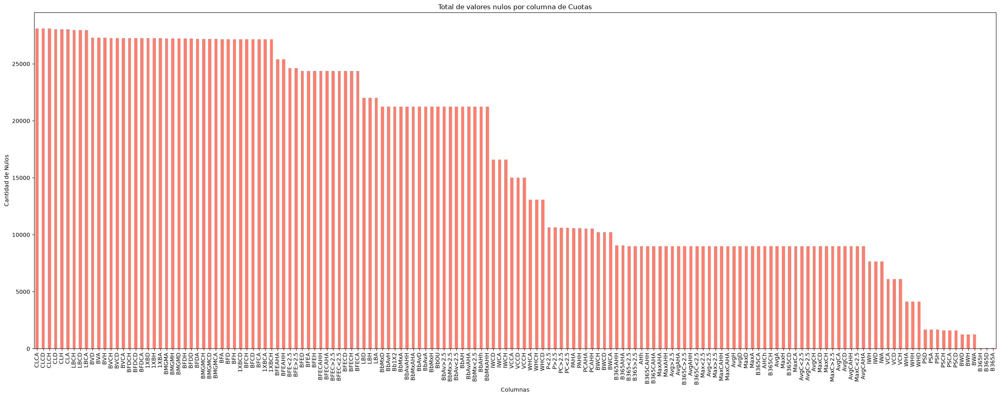

In [7]:
CUOTAS = ['B365H', 'B365D', 'B365A', 'BWH', 'BWD', 'BWA', 'IWH', 'IWD', 'IWA', 'LBH', 'LBD', 'LBA', 'PSH', 'PSD', 'PSA', 'WHH', 'WHD', 'WHA',
          'VCH', 'VCD', 'VCA', 'Bb1X2', 'BbMxH', 'BbAvH', 'BbMxD', 'BbAvD', 'BbMxA', 'BbAvA', 'BbOU', 'BbMx>2.5', 'BbAv>2.5', 'BbMx<2.5',
          'BbAv<2.5', 'BbAH', 'BbAHh', 'BbMxAHH', 'BbAvAHH', 'BbMxAHA', 'BbAvAHA', 'PSCH', 'PSCD', 'PSCA', 'MaxH', 'MaxD', 'MaxA', 'AvgH', 
          'AvgD', 'AvgA', 'B365>2.5', 'B365<2.5', 'P>2.5', 'P<2.5', 'Max>2.5', 'Max<2.5', 'Avg>2.5', 'Avg<2.5', 'AHh', 'B365AHH', 'B365AHA', 'PAHH',
          'PAHA', 'MaxAHH','MaxAHA', 'AvgAHH', 'AvgAHA', 'B365CH', 'B365CD', 'B365CA', 'BWCH', 'BWCD', 'BWCA', 'IWCH', 'IWCD', 'IWCA', 'WHCH', 'WHCD',
          'WHCA', 'VCCH', 'VCCD', 'VCCA', 'MaxCH', 'MaxCD', 'MaxCA', 'AvgCH', 'AvgCD', 'AvgCA', 'B365C>2.5', 'B365C<2.5', 'PC>2.5', 'PC<2.5', 'MaxC>2.5', 
          'MaxC<2.5', 'AvgC>2.5', 'AvgC<2.5', 'AHCh', 'B365CAHH', 'B365CAHA', 'PCAHH', 'PCAHA', 'MaxCAHH', 'MaxCAHA', 'AvgCAHH', 'AvgCAHA', 'BFH', 'BFD', 
          'BFA', '1XBH', '1XBD', '1XBA', 'BFEH', 'BFED', 'BFEA', 'BFE>2.5', 'BFE<2.5', 'BFEAHH', 'BFEAHA', 'BFCH', 'BFCD', 'BFCA', '1XBCH', '1XBCD', '1XBCA', 
          'BFECH', 'BFECD', 'BFECA', 'BFEC>2.5', 'BFEC<2.5', 'BFECAHH', 'BFECAHA', 'BFDH', 'BFDD', 'BFDA', 'BMGMH', 'BMGMD', 'BMGMA', 'BVH', 'BVD', 'BVA', 
          'CLH', 'CLD', 'CLA', 'BFDCH', 'BFDCD', 'BFDCA', 'BMGMCH', 'BMGMCD', 'BMGMCA', 'BVCH', 'BVCD', 'BVCA', 'CLCH', 'CLCD', 'CLCA', 'LBCH', 'LBCD', 'LBCA']
          
nulos_por_columna = df_clean[CUOTAS].isnull().sum()

nulos_por_columna = nulos_por_columna[nulos_por_columna > 0]

plt.figure(figsize=(25, 10))
nulos_por_columna.sort_values(ascending=False).plot(kind='bar', color='salmon')

plt.title('Total de valores nulos por columna de Cuotas')
plt.ylabel('Cantidad de Nulos')
plt.xlabel('Columnas')
plt.xticks(rotation=90) # Rota las etiquetas para que se puedan leer
plt.tight_layout()
plt.show()

Como vemos tenemos cuotas con más de 15k de datos nulos que sería la mitad de nuestro dataset, y estimar o promediar estariamos generando ruido. Por lo que vamos a eliminar los que superen 12k de datos nulos (40% de nuestro dataset)

In [8]:
len(CUOTAS)

156

In [9]:
umbral = len(df_clean) * 0.4
for n in nulos_por_columna.index:
    if nulos_por_columna[n] > umbral:
        df_clean = df_clean.drop(columns=[n])
        CUOTAS.remove(n)

In [10]:
len(CUOTAS)

73

Ahora con los atributos que tienen datos nulos entre 20% y 40% vamos a transformar esas columnas en variables binarias que indiquen la ausencia del dato antes de desechar la columna numérica original (las que superan 40% ya se eliminaron). De esta forma, capturas la señal estadística de por qué la casa de apuestas decidió suspender o no ofrecer ese mercado (como anomalías financieras, partidos oscuros o lesiones) sin introducir ruido matemático.

In [11]:
umbral2 = len(df_clean) * 0.20
columnas_criticas = [col for col in CUOTAS if umbral2 < df_clean[col].isnull().sum() <= umbral]

for col in columnas_criticas:
    df_clean[f"{col}_Ausente"] = df_clean[col].isnull().astype(int)
    df_clean = df_clean.drop(columns=[col])
    CUOTAS.remove(col)

print(f"Se transformaron y eliminaron {len(columnas_criticas)} columnas problemáticas.")

Se transformaron y eliminaron 58 columnas problemáticas.


Ahora con los atributos que quedan (datos nulos <= 20%) vamos a imputar usando la función `KNNImputer`, ya que esta es una estrategia usa las cuotas de diferentes casas de apuestas están altamente correlacionadas. Si falta la cuota de una casa, el algoritmo buscará partidos con cuotas similares en las casas disponibles para estimar el valor faltante con una precisión alta.

In [12]:
columnas_a_imputar = [col for col in CUOTAS if df_clean[col].isnull().sum() > 0 and df_clean[col].isnull().sum() <= umbral2 and df_clean[col].dtype in [np.float64, np.int64]]
scaler = StandardScaler()
df_clean[columnas_a_imputar] = scaler.fit_transform(df_clean[columnas_a_imputar])
imputer = KNNImputer(n_neighbors=5)
df_clean[columnas_a_imputar] = imputer.fit_transform(df_clean[columnas_a_imputar])
df_clean[columnas_a_imputar] = scaler.inverse_transform(df_clean[columnas_a_imputar])
val = 0
for i in columnas_a_imputar:
    if df_clean[i].isnull().sum() > 0:
        print(f"Columna {i} aún tiene valores nulos después de la imputación.")
        val += 1
print(val)


0


In [13]:
val1 = 0
for col in CUOTAS:
    if df_clean[col].dtype in [np.float64, np.int64] and df_clean[col].isnull().sum() > 0:
        val1 += 1
print(val1)

0


La variable `Time` tiene aprox 30% de nulos. Entonces, la vamos a convertir a tipo `INT` para usar `KNNImputer`.

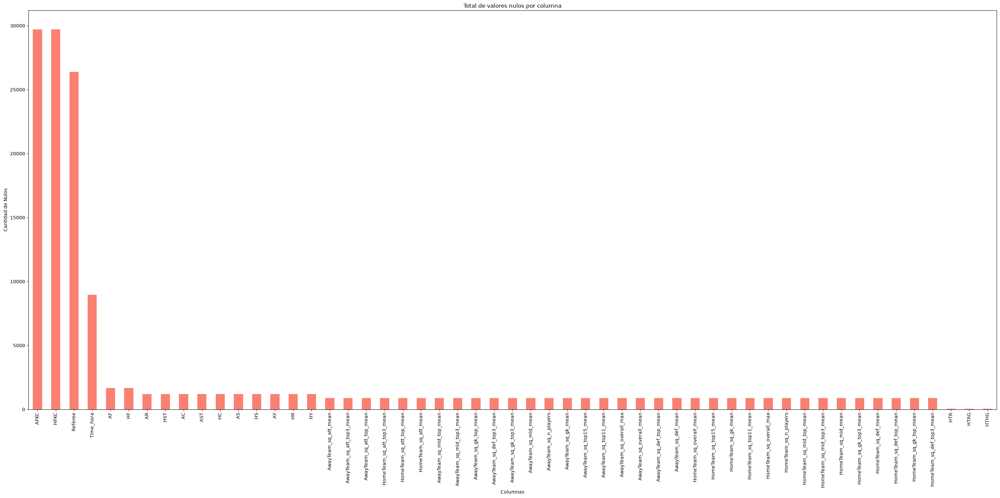

In [14]:
df_clean["Time_hora"] = pd.to_datetime(df_clean["Time"], format="%H:%M", errors="coerce").dt.hour
df_clean = df_clean.drop(columns=["Time"])
faltantes = []
for col in df_clean.columns:
    if df_clean[col].isnull().sum() > 0:
        faltantes.append(col)

col_faltantes = df_clean[faltantes].isnull().sum()

plt.figure(figsize=(30, 15))
col_faltantes.sort_values(ascending=False).plot(kind='bar', color='salmon')

plt.title('Total de valores nulos por columna')
plt.ylabel('Cantidad de Nulos')
plt.xlabel('Columnas')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


Como vemos tenemos a 3 variables (`HFKC`, `AFKC`, `Referee`) superon los 15k de nulos por lo que vamos a eliminar

In [15]:
df_clean = df_clean.drop(columns=['HFKC', 'AFKC', 'Referee'])
col_faltantes = col_faltantes.drop(['HFKC', 'AFKC', 'Referee'])

Y como observamos en la grafica anterior, vamos a imputar con `KNNImputer` para limpiar los datos faltantes de nuestro dataset

In [16]:
numericas = []
for col in col_faltantes.index:
    if df_clean[col].dtype in [np.float64, np.int64]:
        numericas.append(col)

scaler = StandardScaler()
df_clean[numericas] = scaler.fit_transform(df_clean[numericas])
imputer = KNNImputer(n_neighbors=5)
df_clean[numericas] = imputer.fit_transform(df_clean[numericas])
df_clean[numericas] = scaler.inverse_transform(df_clean[numericas])

In [17]:
columnas_con_nulos = df_clean.columns[df_clean.isnull().any()].tolist()
print(columnas_con_nulos)

['HTR']


Tenemos a la variable `HTR` (resultado al descanso) con algunos datos faltantes, entonces como es tipo string no podemos usar el `KNNImputer` la vamos a reconstruir con las variables de `HTHG`(total de goles local al medio tiempo) y `HTAG`(total de goles visitante  al medio tiempo)

In [18]:
m = df_clean["HTR"].isnull()
df_clean.loc[m, "HTR"] = np.select(
    [df_clean.loc[m, "HTHG"] > df_clean.loc[m, "HTAG"],
     df_clean.loc[m, "HTHG"] < df_clean.loc[m, "HTAG"]],
    ["H", "A"], default="D")
print("HTR nulos restantes:", df_clean["HTR"].isnull().sum())

HTR nulos restantes: 0


In [19]:
falta = df_clean.isnull().sum()
falta = falta[falta > 0]
print("Columnas con nulos tras toda la limpieza:", len(falta))

Columnas con nulos tras toda la limpieza: 0


# Distribución de las variables numericas

In [20]:
df_clean.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
FTHG,30182.0,1.56,1.31,0.0,1.0,1.0,2.0,10.0
FTAG,30182.0,1.25,1.18,0.0,0.0,1.0,2.0,13.0
HTHG,30182.0,0.69,0.84,0.0,0.0,0.0,1.0,6.0
HTAG,30182.0,0.55,0.76,0.0,0.0,0.0,1.0,7.0
HS,30182.0,13.50,5.28,-0.0,10.0,13.0,17.0,46.0
...,...,...,...,...,...,...,...,...
MaxCAHH_Ausente,30182.0,0.30,0.46,0.0,0.0,0.0,1.0,1.0
MaxCAHA_Ausente,30182.0,0.30,0.46,0.0,0.0,0.0,1.0,1.0
AvgCAHH_Ausente,30182.0,0.30,0.46,0.0,0.0,0.0,1.0,1.0
AvgCAHA_Ausente,30182.0,0.30,0.46,0.0,0.0,0.0,1.0,1.0


In [21]:
df_clean.describe(include="object")

/tmp/ipykernel_125459/592941607.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  df_clean.describe(include="object")


,Div,Date,HomeTeam,AwayTeam,FTR,HTR
count,30182,30182,30182,30182,30182,30182
unique,9,2152,280,280,3,3
top,E0,22/12/2018,Crystal Palace,Tottenham,H,D
freq,3800,53,190,190,13371,12143


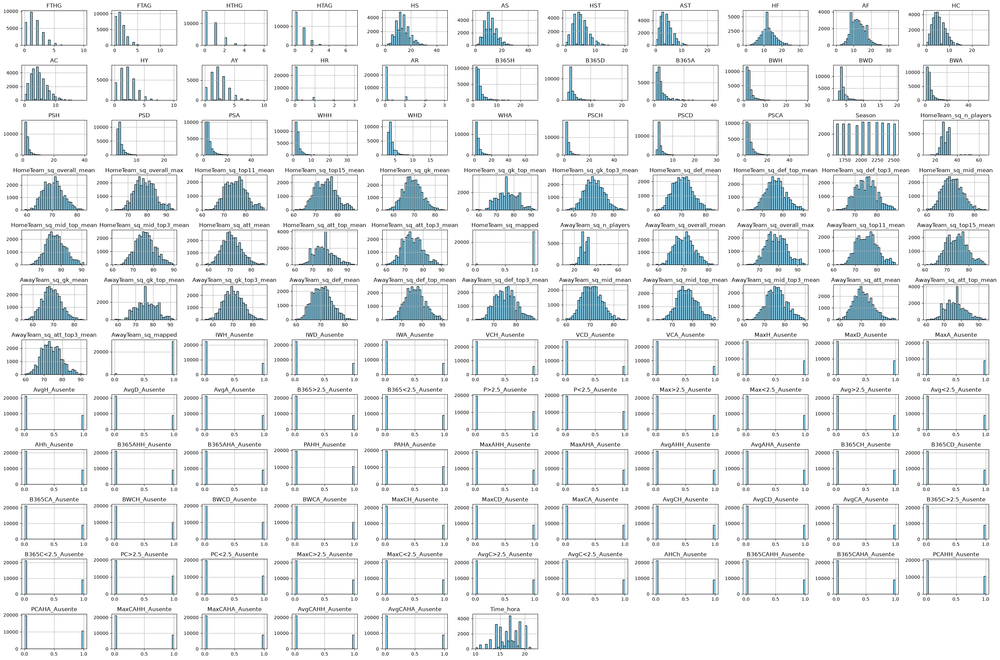

In [22]:
df_clean.hist(figsize=(30,20), bins=30, color='skyblue', edgecolor='black')
plt.tight_layout()
plt.show()

Vamos a ver si tenemos duplicados o no

In [23]:
print("exact duplicate rows:", df_clean.duplicated().sum())
df_clean[df_clean.duplicated(keep=False)].sort_values(list(df_clean.columns)).head(6)

exact duplicate rows: 0


,Div,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,AHCh_Ausente,B365CAHH_Ausente,B365CAHA_Ausente,PCAHH_Ausente,PCAHA_Ausente,MaxCAHH_Ausente,MaxCAHA_Ausente,AvgCAHH_Ausente,AvgCAHA_Ausente,Time_hora


## Outliers

In [24]:
nume = df_clean.select_dtypes(include=[np.number]).columns
out = pd.DataFrame(index=nume)
for c in nume:
    s = df_clean[c].dropna()
    z = (s - s.mean()) / s.std()
    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1
    finf, fsup = q1 - 1.5*iqr, q3 + 1.5*iqr
    out.loc[c, 'z>3 (%)'] = (z.abs() > 3).mean() * 100
    out.loc[c, 'IQR (%)'] = ((s < finf) | (s > fsup)).mean() * 100
    out.loc[c, 'max'] = round(s.max(), 2)
    out.loc[c, 'p99'] = round(s.quantile(0.99), 2)

out = out.sort_values('IQR (%)', ascending=False)
print('Columnas con >=1% de outliers por IQR:', int((out['IQR (%)'] >= 1).sum()), 'de', len(out))
out.head(20)

Columnas con >=1% de outliers por IQR: 40 de 127


,z>3 (%),IQR (%),max,p99
VCH_Ausente,0.000000,20.167650,1.00,1.00
VCA_Ausente,0.000000,20.167650,1.00,1.00
VCD_Ausente,0.000000,20.167650,1.00,1.00
AR,0.669273,12.391492,3.00,1.00
HR,0.563250,10.718309,3.00,1.00
B365D,2.610828,10.701743,21.00,9.50
BWD,2.286131,10.532768,19.50,9.50
B365H,2.315950,9.817110,26.00,11.00
PSCD,2.233119,9.565304,29.31,10.64
WHA,2.531310,9.406269,71.00,21.00


Acá no las vamos a eliminar por estas razones: 
1. **En cuotas son puros**: `AvgA` puede llegar a 47 porque es un “seguro” para la casa de apuestas, es decir equipo grande vs equipo chico. Es información real del mercado, no un error.
2. **En estadísticas son extremos reales**: 30+ tiros o 5+ goles son partidos atípicos pero reales.
3. **Un modelo calibrado los necesita**: este proyecto busca probabilidades y value bets; la cola de cuotas largas (long-shots) es justo donde se gana o se pierde el ROI. Eliminarlos o caparlos sesga las probabilidades predichas.
4. **Casi todo nuestro pipeline es robusto a outliers**: RF, XGBoost y los `_Ausente` no se afectan; para la regresión logística se usa un escalado robusto en train (mediana/IQR), no MinMax que sí se deforma con outliers.

## Feature historial: forma de los últimos 5 partidos

Convertimos cada partido en 2 registros (local y visitante) con las stats **desde el lado del equipo**,
calculamos la media móvil de los **últimos 5 partidos** (no incluimos el partido vivo)
y unimos de vuelta como `H_*_5` (forma del local) y `A_*_5` (forma del visitante).

In [25]:
df_r = df_clean.reset_index().rename(columns={'index': 'match_id'})
df_r['Date_dt'] = pd.to_datetime(df_r['Date'], dayfirst=True, errors='coerce')
df_r = df_r.sort_values(['Date_dt', 'match_id']).reset_index(drop=True)
df_r['seq'] = np.arange(len(df_r))

ev_rows = []
for lado, col in [('H', 'HomeTeam'), ('A', 'AwayTeam')]:
    e = df_r.copy()
    local = e['HomeTeam'] == e[col]
    e['Team']   = e[col]
    e['GF']     = np.where(local, e['FTHG'], e['FTAG'])
    e['GA']     = np.where(local, e['FTAG'], e['FTHG'])
    ganador = 'H' if lado == 'H' else 'A'
    e['Pts']    = np.select([e['FTR'] == ganador, e['FTR'] == 'D'], [3, 1], 0)
    e['SGF']    = np.where(local, e['HS'], e['AS'])
    e['SGA']    = np.where(local, e['AS'], e['HS'])
    e['SOTF']   = np.where(local, e['HST'], e['AST'])
    e['SOTA']   = np.where(local, e['AST'], e['HST'])
    e['CF']     = np.where(local, e['HC'], e['AC'])
    e['CA']     = np.where(local, e['AC'], e['HC'])
    e['FF']     = np.where(local, e['HF'], e['AF'])
    e['FA']     = np.where(local, e['AF'], e['HF'])
    e['CardF']  = np.where(local, e['HY'] + e['HR'], e['AY'] + e['AR'])
    e['CardA']  = np.where(local, e['AY'] + e['AR'], e['HY'] + e['HR'])
    e['CS']     = (e['GA'] == 0).astype(int)
    e['lado']   = lado
    cols = ['match_id','seq','Team','lado','GF','GA','Pts','SGF','SGA','SOTF','SOTA','CF','CA','FF','FA','CardF','CardA','CS']
    ev_rows.append(e[e['Team'].notna()][cols])
ev = pd.concat(ev_rows, ignore_index=True)
ev = ev.sort_values(['Team', 'seq']).reset_index(drop=True)

ROLL = ['GF','GA','Pts','SGF','SGA','SOTF','SOTA','CF','CA','FF','FA','CardF','CardA','CS']
for f in ROLL:
    ev[f + '_5'] = ev.groupby('Team')[f].transform(lambda s: s.rolling(5, min_periods=1).mean().shift(1))

df_clean['match_id'] = np.arange(len(df_clean))
h = ev[ev['lado'] == 'H'][['match_id'] + [f + '_5' for f in ROLL]]
h.columns = ['match_id'] + ['H_' + f + '_5' for f in ROLL]
a = ev[ev['lado'] == 'A'][['match_id'] + [f + '_5' for f in ROLL]]
a.columns = ['match_id'] + ['A_' + f + '_5' for f in ROLL]
df_clean = df_clean.merge(h, on='match_id', how='left').merge(a, on='match_id', how='left').drop(columns=['match_id'])
print('Features rolling agregadas:', 2 * len(ROLL))
print('Sin historial (H_GF_5 NaN):', int(df_clean['H_GF_5'].isna().sum()), '| (A_GF_5 NaN):', int(df_clean['A_GF_5'].isna().sum()))

/tmp/ipykernel_125459/4217307097.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_r = df_clean.reset_index().rename(columns={'index': 'match_id'})
/tmp/ipykernel_125459/4217307097.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_r['Date_dt'] = pd.to_datetime(df_r['Date'], dayfirst=True, errors='coerce')
/tmp/ipykernel_125459/4217307097.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.co

Features rolling agregadas: 28
Sin historial (H_GF_5 NaN): 132 | (A_GF_5 NaN): 148


/tmp/ipykernel_125459/4217307097.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_clean['match_id'] = np.arange(len(df_clean))


## Imputación de las feature historial
Los NaN de `H_*_5`/`A_*_5` (equipos sin 5 partidos previos) se imputan con la media de esa liga y temporada, el valor típico de la media móvil del equipo.

In [26]:
ROLL5 = [c for c in df_clean.columns if c.endswith('_5')]
print('NaN en rolling antes:', int(df_clean[ROLL5].isna().sum().sum()))
for c in ROLL5:
    medias = df_clean.groupby(['Div', 'Season'])[c].transform('mean')
    df_clean[c] = df_clean[c].fillna(medias)
print('NaN en rolling después:', int(df_clean[ROLL5].isna().sum().sum()))

NaN en rolling antes: 3920
NaN en rolling después: 0


## Atributos al finalizar
Eliminamos `FTHG, FTAG, HTHG, HTAG, HTR, HS, AS, HST, AST, HF, AF, HC, AC, HY, AY, HR, AR` que se conocen al finalizar el partido. Su único rol fue calcular los historiales `H_*_5`/`A_*_5`. 

In [27]:
finalizar = ['FTHG', 'FTAG', 'HTHG', 'HTAG', 'HTR', 'HS', 'AS', 'HST', 'AST',
                    'HC', 'AC', 'HF', 'AF', 'HY', 'AY', 'HR', 'AR']

columnas_a_borrar = [col for col in finalizar if col in df_clean.columns]
df_clean = df_clean.drop(columns=columnas_a_borrar)
print('FTR conservado como target:', 'FTR' in df_clean.columns)
df_clean.info()


FTR conservado como target: True
<class 'pandas.DataFrame'>
RangeIndex: 30182 entries, 0 to 30181
Data columns (total 144 columns):
 #    Column                     Non-Null Count  Dtype  
---   ------                     --------------  -----  
 0    Div                        30182 non-null  str    
 1    Date                       30182 non-null  str    
 2    HomeTeam                   30182 non-null  str    
 3    AwayTeam                   30182 non-null  str    
 4    FTR                        30182 non-null  str    
 5    B365H                      30182 non-null  float64
 6    B365D                      30182 non-null  float64
 7    B365A                      30182 non-null  float64
 8    BWH                        30182 non-null  float64
 9    BWD                        30182 non-null  float64
 10   BWA                        30182 non-null  float64
 11   PSH                        30182 non-null  float64
 12   PSD                        30182 non-null  float64
 13   PSA    

## Mapa de correlación

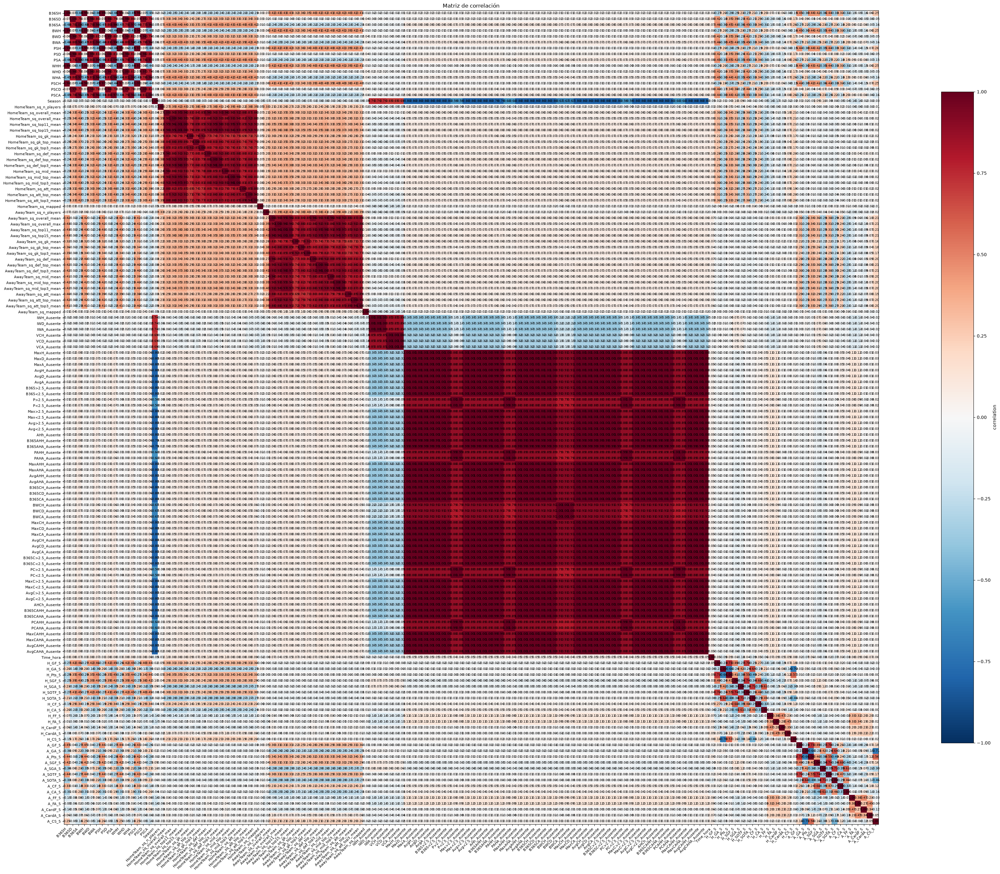

In [28]:
num = df_clean.select_dtypes(include=[np.number]).columns
corr = df_clean[num].corr()
fig, ax = plt.subplots(figsize=(50, 40))
im = ax.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1)
ax.set_xticks(range(len(corr))); ax.set_xticklabels(corr.columns, rotation=45, ha="right", fontsize=8)
ax.set_yticks(range(len(corr))); ax.set_yticklabels(corr.columns, fontsize=8)
for i in range(len(corr)):
    for j in range(len(corr)):
        ax.text(j, i, f"{corr.iloc[i, j]:.2f}", ha="center", va="center", fontsize=7)
fig.colorbar(im, ax=ax, shrink=0.8, label="correlation")
ax.set_title("Matriz de correlación")
fig.subplots_adjust(bottom=0.25)
plt.show()

## Feature Engineer
En la mayoria de atributos de cuotas, notamos que las casas copian el mercado teniendo una correlación alta entre ellas, así que de todas los bloques conservamos únicamente la media del mercado: `AvgH`, `AvgD`, `AvgA`.

In [29]:
TARGET = 'FTR'
ID = ['Date', 'Date_dt', 'HomeTeam', 'AwayTeam', 'Div']
FEATURES = [c for c in df_clean.columns if c not in ID + [TARGET]]

df_final = df_clean[FEATURES + [TARGET, 'Date']].copy()
df_final['Date_dt'] = pd.to_datetime(df_final['Date'], dayfirst=True, errors='coerce')

cuotas_purge = [c for c in CUOTAS if c in df_final.columns and c not in ['AvgH', 'AvgD', 'AvgA']]
df_final = df_final.drop(columns=cuotas_purge)

AVG_ODDS = ['AvgH', 'AvgD', 'AvgA']
_sc = StandardScaler()
_X_s = _sc.fit_transform(df[AVG_ODDS])
_X_i = KNNImputer(n_neighbors=5).fit_transform(_X_s)
df_final[AVG_ODDS] = _sc.inverse_transform(_X_i)
print('df_final:', df_final.shape, '| cuotas eliminadas:', len(cuotas_purge), '| AvgH/D/A recuperadas: OK')

/tmp/ipykernel_125459/3769700835.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_final['Date_dt'] = pd.to_datetime(df_final['Date'], dayfirst=True, errors='coerce')


df_final: (30182, 130) | cuotas eliminadas: 15 | AvgH/D/A recuperadas: OK


In [30]:
UMBRAL_CORR = 0.95
corte = df_final['Date_dt'].quantile(0.80)
train_idx = df_final['Date_dt'] <= corte

NUM_FEAT = [c for c in df_final.columns if c not in [TARGET, 'Date', 'Date_dt']
            and pd.api.types.is_numeric_dtype(df_final[c])]
corr_m = df_final.loc[train_idx, NUM_FEAT].corr().abs()

order = (['AvgH', 'AvgD', 'AvgA', 'Time_hora',
          'HomeTeam_sq_top11_mean', 'AwayTeam_sq_top11_mean']
         + sorted([c for c in NUM_FEAT if c.startswith(('H_', 'A_'))])
         + sorted([c for c in NUM_FEAT if c not in ['AvgH', 'AvgD', 'AvgA', 'Time_hora',
                   'HomeTeam_sq_top11_mean', 'AwayTeam_sq_top11_mean']
                   and not c.startswith(('H_', 'A_'))]))

kept, dropped = [], set()
for c in order:
    if c not in corr_m.columns or c in dropped:
        continue
    kept.append(c)
    for d in NUM_FEAT:
        r = corr_m.loc[c, d]
        if d not in kept and d not in dropped and not (r != r) and r > UMBRAL_CORR:
            dropped.add(d)

drop_list = [d for d in dropped if d in df_final.columns]
df_final = df_final.drop(columns=drop_list)
print('eliminadas por correlación:', len(drop_list))
print('pervivió top11:', 'HomeTeam_sq_top11_mean' in df_final.columns)

eliminadas por correlación: 65
pervivió top11: True


## Squad:
Del bloque squad nos quedamos **solo con la media global del 11 inicial** (`top11_mean`): las medias por línea
(def/mid/att/top3…) tiene una correlacion de 0.88–0.96 con top11 y no aportan, entonces las eliminamos. Además, para el
resultado importa más la **ventaja neta** sobre el rival que el valor absoluto: creamos `DIF_sq_top11 = local − visitante`
y quitamos la absoluta del visitante (queda representada por la diferencia + la del local). Los flags `_mapped` se
conservan (marcan slots sin squad imputados).

In [31]:
KEEP_SQ = {'HomeTeam_sq_top11_mean', 'AwayTeam_sq_top11_mean',
           'HomeTeam_sq_mapped', 'AwayTeam_sq_mapped'}
sq_drop = [c for c in df_final.columns if '_sq_' in c and c not in KEEP_SQ]
df_final = df_final.drop(columns=sq_drop)

df_final['DIF_sq_top11'] = df_final['HomeTeam_sq_top11_mean'] - df_final['AwayTeam_sq_top11_mean']
df_final = df_final.drop(columns=['AwayTeam_sq_top11_mean'])
print('squad granulares eliminadas:', len(sq_drop))
print('squad restantes:', [c for c in df_final.columns if '_sq_' in c or c.startswith('DIF_sq_')])

squad granulares eliminadas: 22
squad restantes: ['HomeTeam_sq_top11_mean', 'HomeTeam_sq_mapped', 'AwayTeam_sq_mapped', 'DIF_sq_top11']


## Mutual Information
`mutual_info_classif` es una función que mide cuánta información aporta cada feature para predecir `FTR` (no es lineal, a diferencia de la correlación). Se calcula **solo en train** y conservamos el **top 40**: corta flags/ruido sin aporte.

In [32]:
from sklearn.feature_selection import mutual_info_classif

NUM_FEAT = [c for c in df_final.columns if c not in [TARGET, 'Date', 'Date_dt']
            and pd.api.types.is_numeric_dtype(df_final[c])]
y_cod = df_final.loc[train_idx, TARGET].map({'H': 0, 'D': 1, 'A': 2}).astype(int)

mi = mutual_info_classif(df_final.loc[train_idx, NUM_FEAT], y_cod, random_state=42, n_neighbors=3)
mi_serie = pd.Series(mi, index=NUM_FEAT).sort_values(ascending=False)

N_TOP = 40
keep_mi = list(mi_serie.head(N_TOP).index)
df_final = df_final[keep_mi + [TARGET, 'Date', 'Date_dt']]
print('Top 20 por Mutual Information:')
print(mi_serie.head(20).round(4).to_string())

Top 20 por Mutual Information:
AvgA                      0.0683
DIF_sq_top11              0.0649
AvgH                      0.0641
HomeTeam_sq_top11_mean    0.0296
A_GF_5                    0.0279
A_Pts_5                   0.0276
A_SGF_5                   0.0189
H_GF_5                    0.0185
H_SGA_5                   0.0181
AvgD                      0.0172
H_SGF_5                   0.0170
H_SOTF_5                  0.0168
A_SOTF_5                  0.0166
H_Pts_5                   0.0159
A_SOTA_5                  0.0157
A_CS_5                    0.0148
H_CA_5                    0.0144
H_SOTA_5                  0.0124
H_CF_5                    0.0121
A_CF_5                    0.0114


## Verificación final

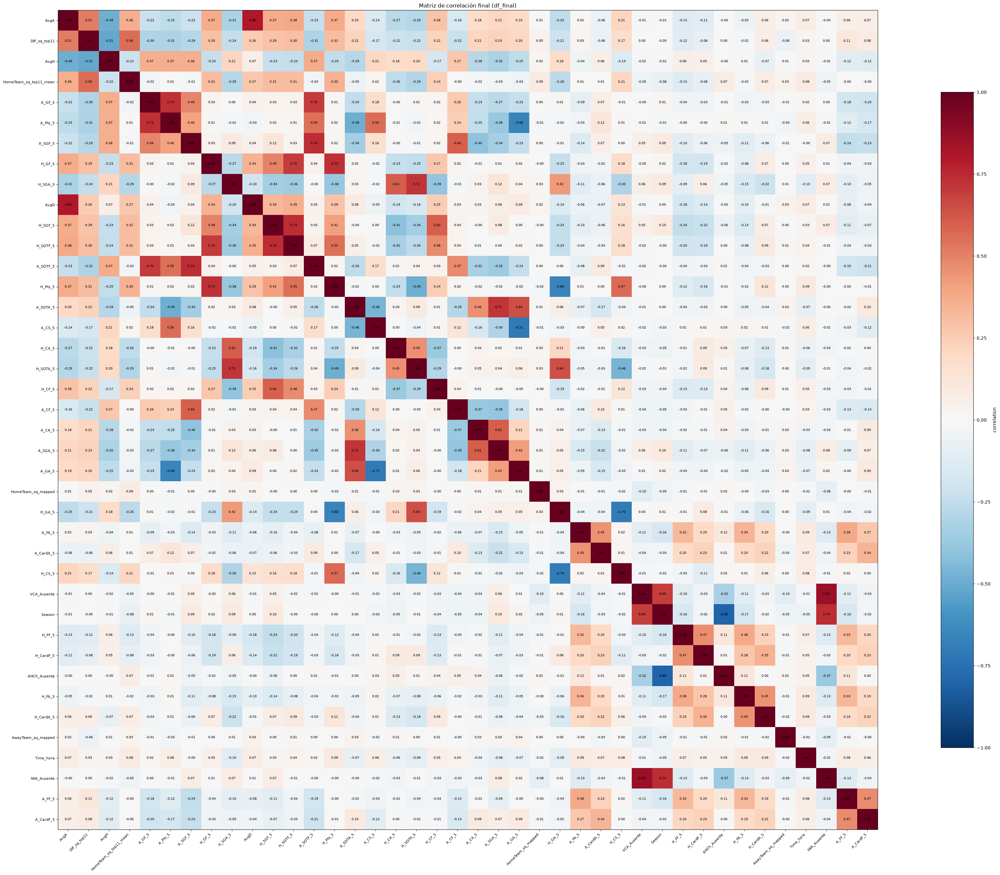

In [33]:
FEATURES = [c for c in df_final.columns if c not in [TARGET, 'Date', 'Date_dt']]
corr = df_final[FEATURES].corr()
fig, ax = plt.subplots(figsize=(50, 40))
im = ax.imshow(corr, cmap='RdBu_r', vmin=-1, vmax=1)
ax.set_xticks(range(len(corr))); ax.set_xticklabels(corr.columns, rotation=45, ha='right', fontsize=8)
ax.set_yticks(range(len(corr))); ax.set_yticklabels(corr.columns, fontsize=8)
for i in range(len(corr)):
    for j in range(len(corr)):
        ax.text(j, i, f'{corr.iloc[i, j]:.2f}', ha='center', va='center', fontsize=7)
fig.colorbar(im, ax=ax, shrink=0.8, label='correlation')
ax.set_title('Matriz de correlación final (df_final)')
fig.subplots_adjust(bottom=0.25)
plt.show()

In [34]:
df_final.to_csv("../data/dataset_final.csv", index=False)